# Plot filtered tf corrected external data

In [1]:
from pixell import reproject, enmap, utils, enplot
import matplotlib.pyplot as plt
import numpy as np
import healpy as hp
import pymaster as nmt
from pixell import curvedsky

In [2]:
%matplotlib inline

In [3]:
### Parameters for initial external data
dir_initial_data = '/scratch/gpfs/SIMONSOBS/users/ar3186/external_data/data'
exp = 'planck'
maps_type = 'npipe6v20'
band = '100'
nside = 512
res = 1.0
lmax = 2160

In [4]:
### geometry template 
# (used to reproject the initial maps in the same geometry as the filtered coadded maps)
path_iso_geometry_template = '/home/ar3186/pwg-scripts/iso-sat-review/mapmaking/band_car_fejer1_5arcmin.fits'

### iso-sat analysis mask
# (used in soopercool to compute the TF corrected filtered coadded data ps)
path_iso_analysis_mask = '/scratch/gpfs/SIMONSOBS/sat-iso/transfer_function/satp3/south/soopercool_outputs/science/masks/analysis_mask.fits'

### binning used in soopercool for the filtered data (same to be used for the initial data)
binning_file = '/scratch/gpfs/SIMONSOBS/sat-iso/transfer_function/soopercool_inputs/binning_car_lmax2160_deltal15_large_first_bin.npz'

In [5]:
### Parameters for filtered coadded external data maps and their TF corrected cls
path_maps_filtered_coadded = '/scratch/gpfs/SIMONSOBS/users/ar3186/external_data/filtered_data/planck/npipe6v20/satp3/f090/coadded_maps/planck_car_100_res1.0amin_coords_c_bundle0_f090_det_lower_filtered.fits'
path_cls_filtered_coadded_tf = '/scratch/gpfs/SIMONSOBS/users/ar3186/external_data/soopercool_outputs/cells/decoupled_pcls_planck_f100_filtered_SATp3_f090_south_science__0_x_planck_f100_filtered_SATp3_f090_south_science__0.npz'

In [6]:
dwg = 5  # downgrade for pixell map plots (except full sky maps)

## Initial external data maps

In [7]:
# path_initial_planck_data_c = f'{dir_initial_planck_data}/{exp}/maps/{maps_type}/{exp}_{pix}_{band}_nside{nside}_coords_c.fits'
# map_initial_planck_data_c = hp.read_map(path_initial_planck_data_c, field=(0,1,2))

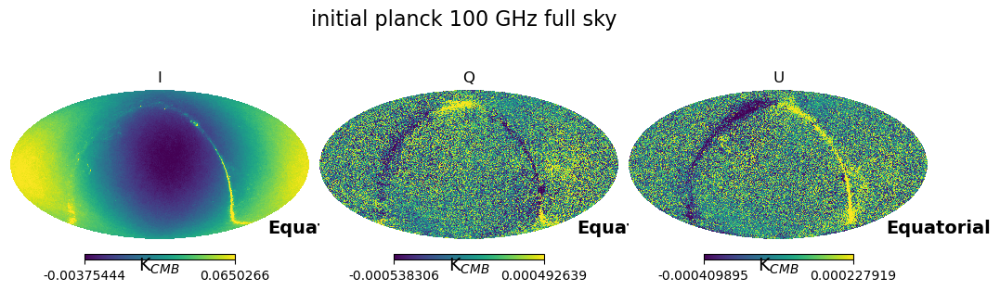

In [8]:
## Maps initial external data full sky in hp
path_maps_initial_data_hp = f'{dir_initial_data}/{exp}/maps/{maps_type}/{exp}_hp_{band}_nside{nside}_coords_c.fits'
maps_initial_data_hp = hp.read_map(path_maps_initial_data_hp, field=(0,1,2))

fig = plt.figure(figsize=(10., 3.))
plt.suptitle(f'initial {exp} {band} GHz full sky', fontsize=16)
for istokes, stokes in enumerate(['I', 'Q', 'U']):
    hp.mollview(maps_initial_data_hp[istokes], title=f'{stokes}', coord='c', norm='hist', unit=r'K$_{CMB}$', sub=(1, 3, istokes + 1))

initial planck 100 GHz full sky I map:


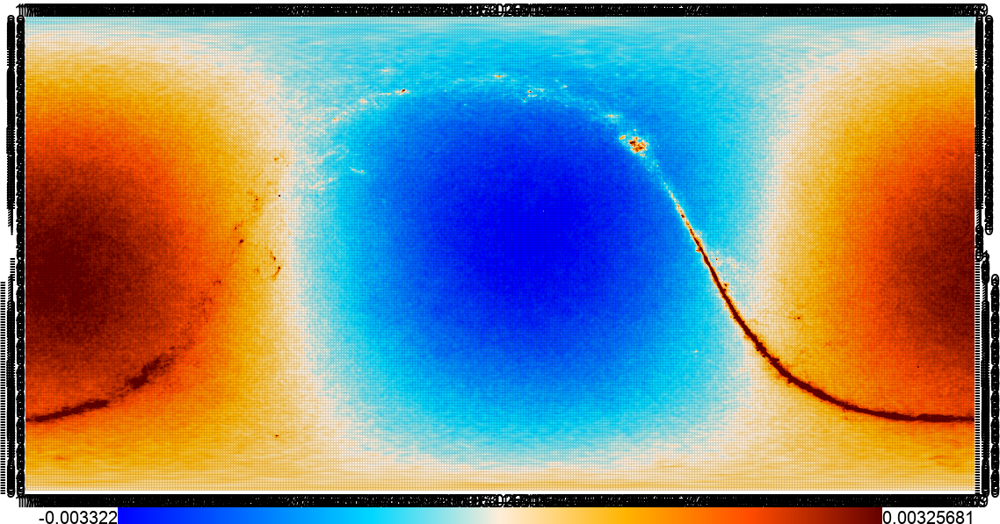

initial planck 100 GHz full sky Q map:


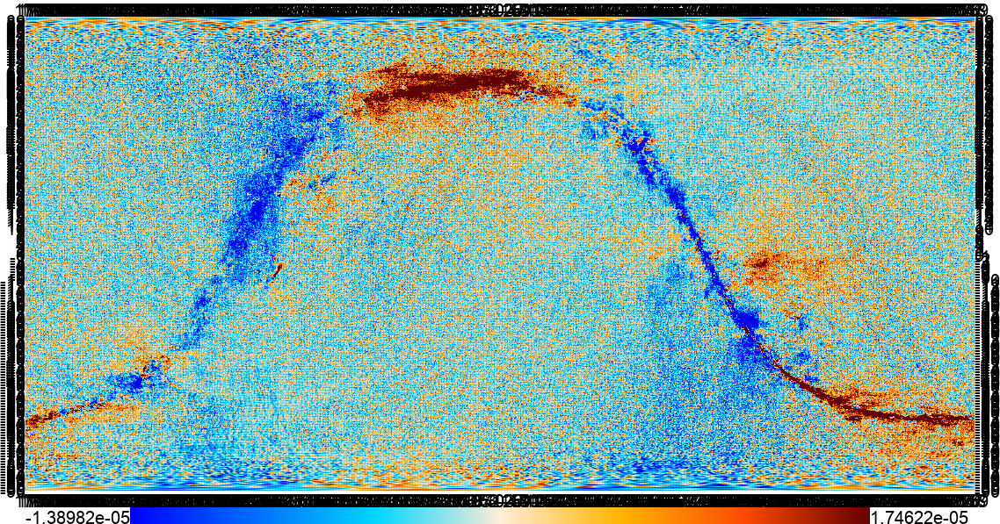

initial planck 100 GHz full sky U map:


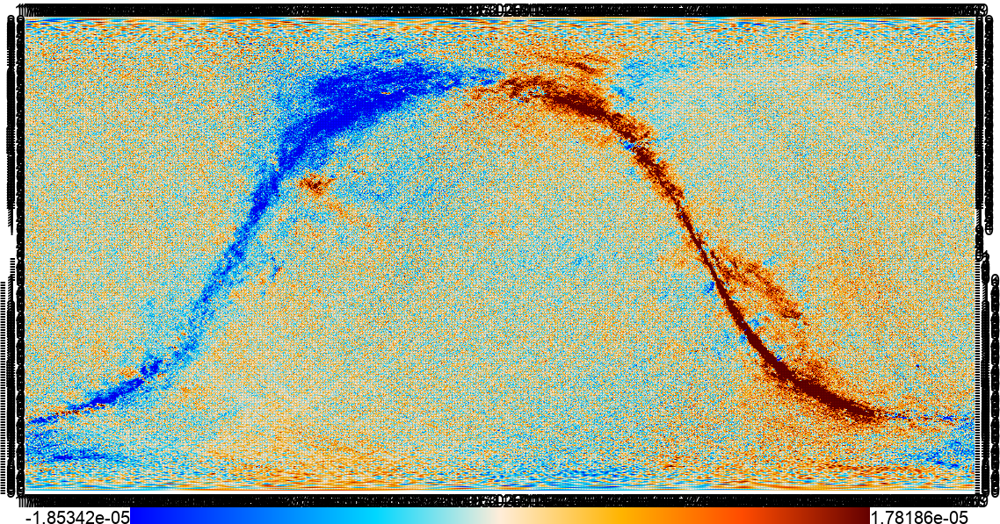

In [9]:
## Maps initial external data full sky in car
path_maps_initial_data_car = f'{dir_initial_data}/{exp}/maps/{maps_type}/{exp}_car_{band}_res{res}amin_coords_c.fits'
maps_initial_data_car = enmap.read_map(path_maps_initial_data_car)

for istokes, stokes in enumerate(['I', 'Q', 'U']):
    print(f'initial {exp} {band} GHz full sky {stokes} map:')
    enplot.pshow(maps_initial_data_car[istokes], colorbar=True, downgrade=20)

Initial planck 100 GHz I map in iso geometry:


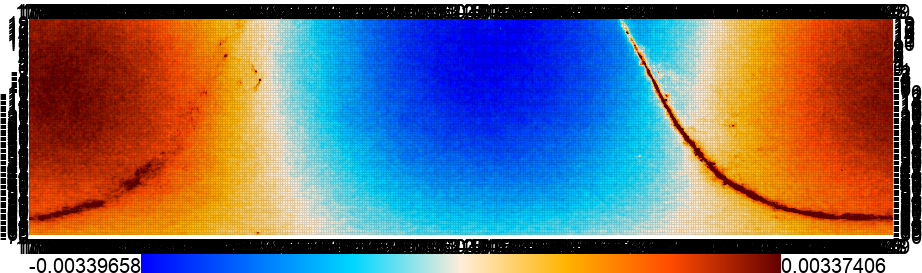

Initial planck 100 GHz Q map in iso geometry:


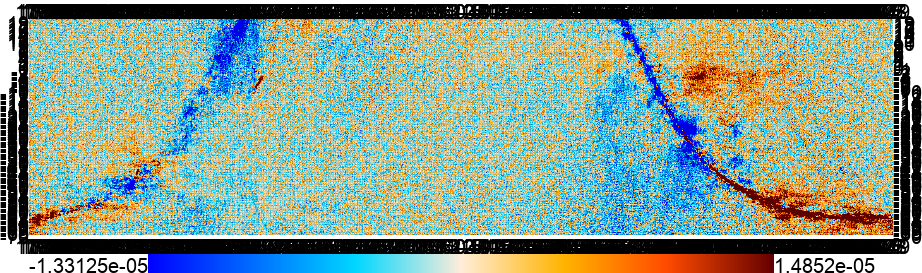

Initial planck 100 GHz U map in iso geometry:


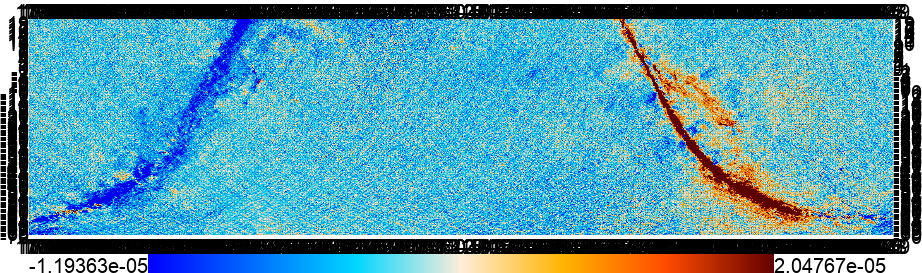

In [10]:
## Maps initial external data partial sky (--> geometry of the iso-sat analysis: band and 5amin) in car
# (we always use this geometry everywhere)

# get the geometry of the template
shape, wcs = enmap.read_map_geometry(path_iso_geometry_template)

# reproject the initial hp map to car with the geometry from the iso template
maps_initial_data_car_isogeo = reproject.healpix2map(maps_initial_data_hp, shape=shape, wcs=wcs)

# plot
for istokes, stokes in enumerate(['I', 'Q', 'U']):
    print(f'Initial {exp} {band} GHz {stokes} map in iso geometry:')
    enplot.pshow(maps_initial_data_car_isogeo[istokes], colorbar=True, downgrade=dwg)

iso-sat analysis mask:


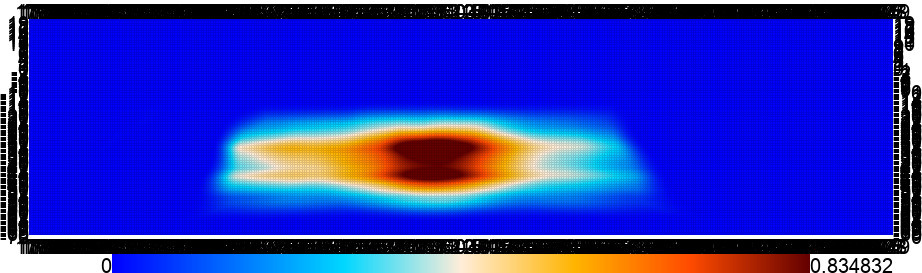

In [11]:
## Maps initial external data partial sky (--> iso-sat analysis mask) in car

# load iso-sat analysis mask
analysis_mask_car = enmap.read_map(path_iso_analysis_mask)
print('iso-sat analysis mask:')
enplot.pshow(analysis_mask_car, colorbar=True, downgrade=dwg)

Initial planck 100 GHz I map w/ iso-sat analysis mask:


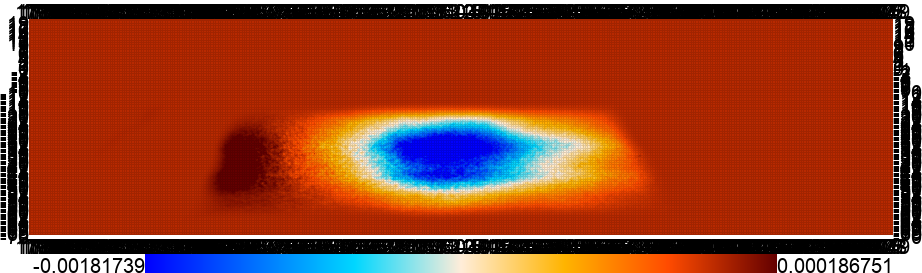

Initial planck 100 GHz Q map w/ iso-sat analysis mask:


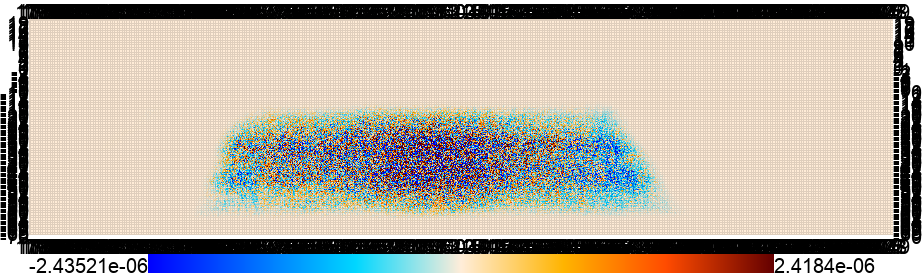

Initial planck 100 GHz U map w/ iso-sat analysis mask:


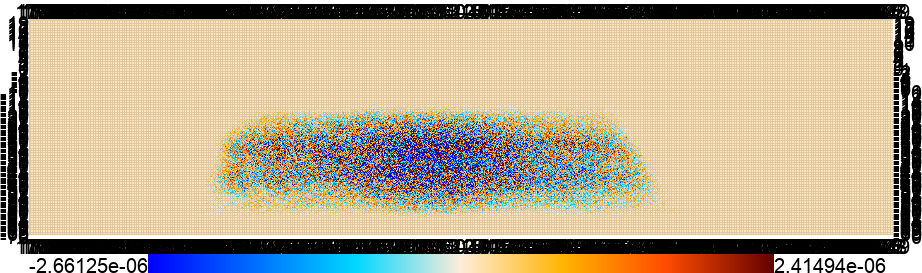

In [12]:
for istokes, stokes in enumerate(['I', 'Q', 'U']):
    print(f'Initial {exp} {band} GHz {stokes} map w/ iso-sat analysis mask:')
    enplot.pshow(maps_initial_data_car_isogeo[istokes]*analysis_mask_car, colorbar=True, downgrade=dwg)

## Filtered coadded maps

In [13]:
maps_filtered_coadded = enmap.read_map(path_maps_filtered_coadded)

Filtered coadded I map:


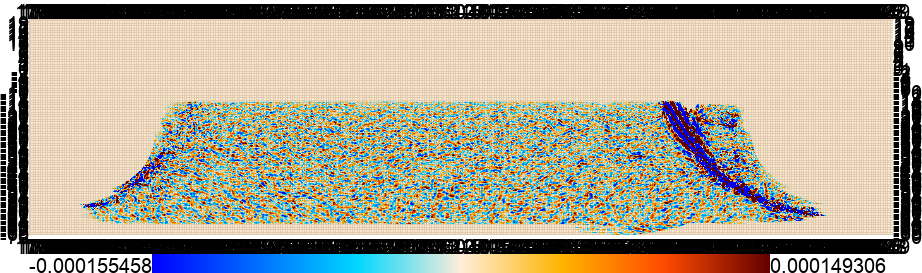

Filtered coadded Q map:


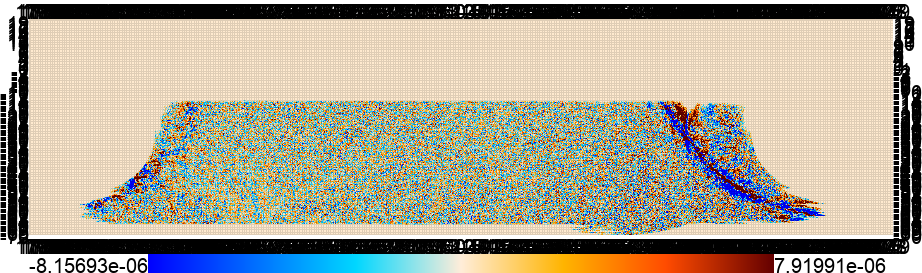

Filtered coadded U map:


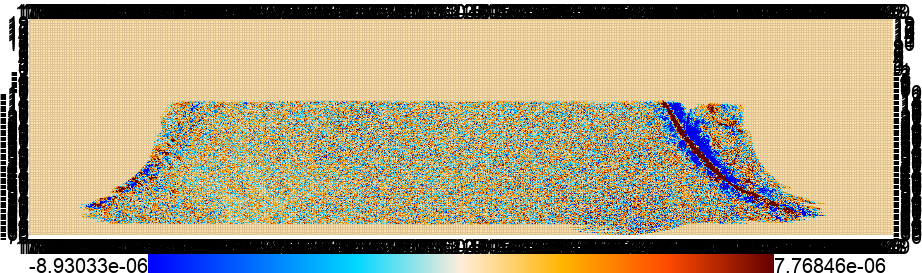

In [14]:
for istokes, stokes in enumerate(['I', 'Q', 'U']):
    print(f"Filtered coadded {stokes} map:")
    enplot.pshow(maps_filtered_coadded[istokes], colorbar=True, downgrade=dwg)

Filtered coadded I map w/ iso-sat analysis mask:


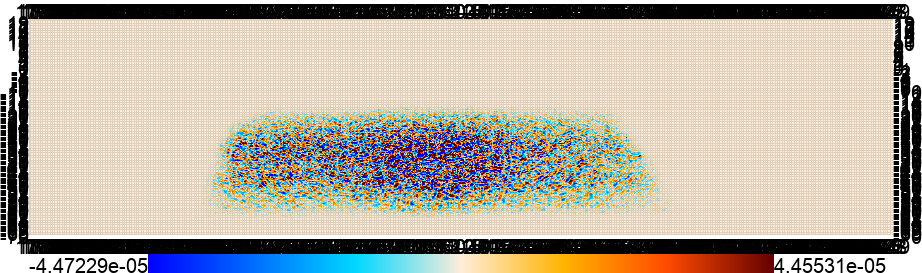

Filtered coadded Q map w/ iso-sat analysis mask:


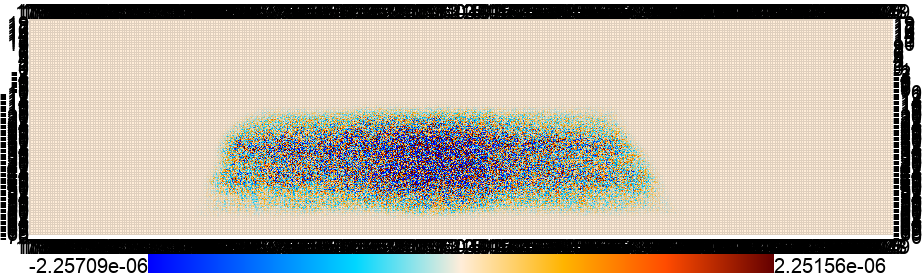

Filtered coadded U map w/ iso-sat analysis mask:


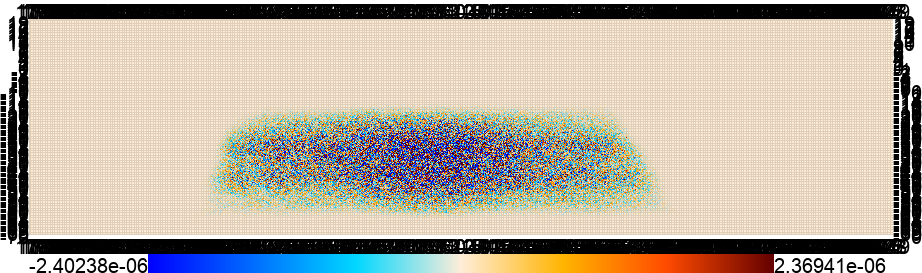

In [15]:
for istokes, stokes in enumerate(['I', 'Q', 'U']):
    print(f"Filtered coadded {stokes} map w/ iso-sat analysis mask:")
    enplot.pshow(maps_filtered_coadded[istokes]*analysis_mask_car, colorbar=True, downgrade=dwg)

## TF corrected power spectra from filtered coadded maps

In [16]:
cls_filtered_coadded_tf = np.load(path_cls_filtered_coadded_tf)
print(list(cls_filtered_coadded_tf.keys()))

['TT', 'TE', 'TB', 'ET', 'BT', 'EE', 'EB', 'BE', 'BB', 'lb']


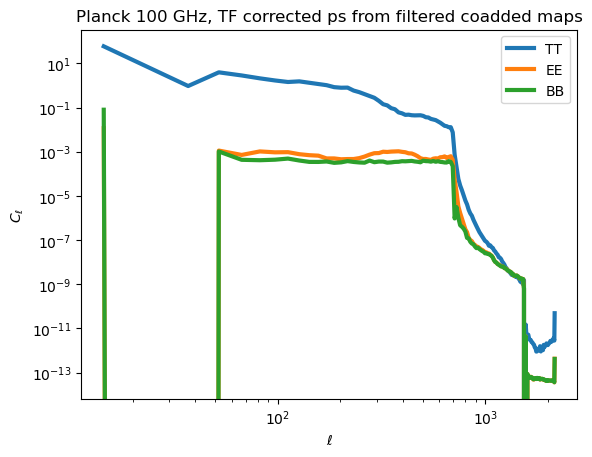

In [17]:
for istokes, stokes in enumerate(['TT', 'EE', 'BB']):
    plt.plot(cls_filtered_coadded_tf['lb'], cls_filtered_coadded_tf[stokes], label=stokes, linewidth=3)
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz, TF corrected ps from filtered coadded maps')
plt.legend()
plt.show()

## Compare Cls initial external data VS filtered coadded tf corrected external data

#### 1) fast naive ps estimation (anafast like but w/ pixell)

In [18]:
lmax_fast = 1500
lmin_fast = 2
ells_fast = np.arange(lmin_fast, lmax_fast + 1)

In [19]:
cls_fast_initial = curvedsky.alm2cl(curvedsky.map2alm(maps_initial_data_car_isogeo*analysis_mask_car, lmax=lmax_fast))
cls_fast_filtered = curvedsky.alm2cl(curvedsky.map2alm(maps_filtered_coadded*analysis_mask_car, lmax=lmax_fast))

In [20]:
cls_fast_initial.shape, cls_fast_filtered.shape

((3, 1501), (3, 1501))

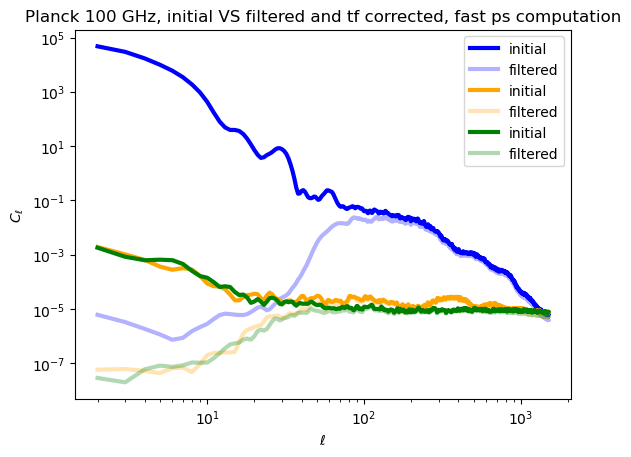

In [21]:
cols_initial = ['blue', 'orange', 'green']
for i in range(len(cls_fast_filtered)):
    plt.plot(ells_fast, cls_fast_initial[i, lmin_fast:]*1e12, label='initial', color=cols_initial[i], linewidth=3)
    plt.plot(ells_fast, cls_fast_filtered[i, lmin_fast:]*1e12, label='filtered', color=cols_initial[i], linewidth=3, alpha=0.3)
plt.legend()
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz, initial VS filtered and tf corrected, fast ps computation')
plt.show()

#### 2) proper Namaster ps estimation 
(from soopercool for the filtered coadded maps, analogus to that for the initial external data)

In [22]:
binning_edges = np.load(binning_file)
print(list(binning_edges.keys()))
# binning_edges['bin_low'], binning_edges['bin_high']
bin_obj = nmt.NmtBin.from_edges(ell_ini=binning_edges['bin_low'][:-1], ell_end=binning_edges['bin_high'][:-1], is_Dell=False)
lmax=2158

['bin_low', 'bin_high', 'bin_center']


### TT

In [ ]:
# compute ps for initial external data in car and with the iso-sat geometry
field_TT = nmt.NmtField(mask=analysis_mask_car, maps=[maps_initial_data_car_isogeo[0]], wcs=wcs, lmax=lmax, lmax_mask=lmax)
cls_initial_TT = (nmt.compute_full_master(field_TT, field_TT, bin_obj))

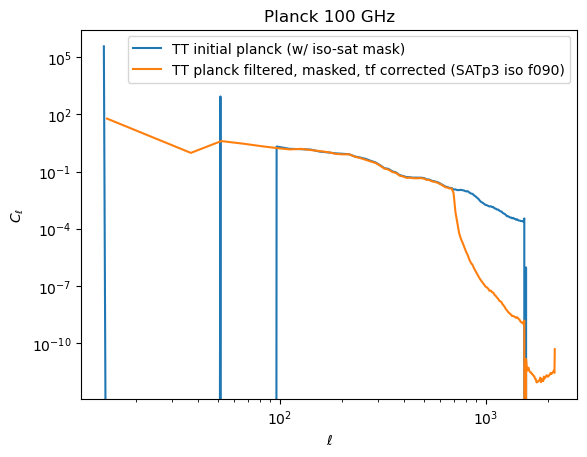

In [27]:
plt.plot(bin_obj.get_effective_ells(), cls_initial_TT[0]*1e12, label=f'TT initial {exp} (w/ iso-sat mask)')
plt.plot(cls_filtered_coadded_tf['lb'], cls_filtered_coadded_tf['TT'], label=f'TT {exp} filtered, masked, tf corrected (SATp3 iso f090)')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz')
plt.legend()
plt.show()

### EE

In [28]:
# compute ps for initial external data in car and with the iso-sat geometry
field_pol = nmt.NmtField(mask=analysis_mask_car, maps=[maps_initial_data_car_isogeo[1], maps_initial_data_car_isogeo[2]], wcs=wcs, lmax=lmax, lmax_mask=lmax)
cls_initial_pol = (nmt.compute_full_master(field_pol, field_pol, bin_obj))

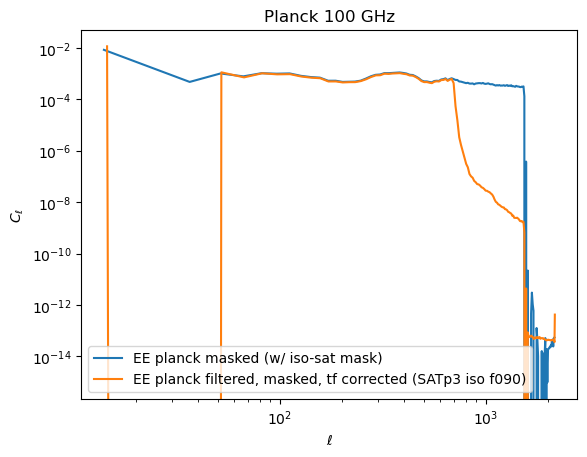

In [29]:
plt.plot(bin_obj.get_effective_ells(), cls_initial_pol[0]*1e12, label=f'EE {exp} masked (w/ iso-sat mask)')
plt.plot(cls_filtered_coadded_tf['lb'], cls_filtered_coadded_tf['EE'], label=f'EE {exp} filtered, masked, tf corrected (SATp3 iso f090)')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz')
plt.legend()
plt.show()

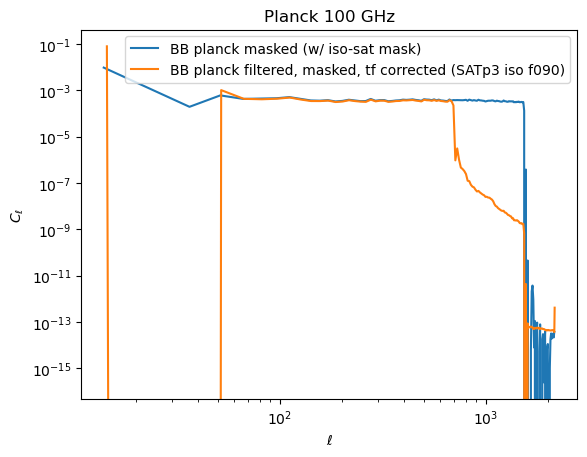

In [30]:
plt.plot(bin_obj.get_effective_ells(), cls_initial_pol[3]*1e12, label=f'BB {exp} masked (w/ iso-sat mask)')
plt.plot(cls_filtered_coadded_tf['lb'], cls_filtered_coadded_tf['BB'], label=f'BB {exp} filtered, masked, tf corrected (SATp3 iso f090)')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$C_\ell$')
plt.title('Planck 100 GHz')
plt.legend()
plt.show()